# lesson

#### Architecture - Semantic Search using Elastic Search


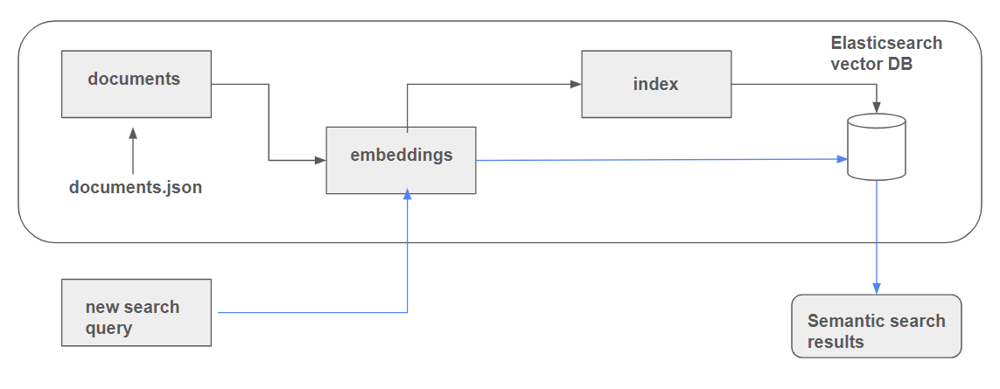

* Two very important concepts in Elasticsearch are documents and indexes.

* A document is collection of fields with their associated values. 

* To work with Elasticsearch you have to organize your data into documents, and then add all your documents to an index. 

* Index as a collection of documents that is stored in a highly optimized format designed to perform efficient searches.

#### Step 1: Prepare documents

In [24]:
import json

with open('documents.json', 'rt') as f_in:
    docs_raw = json.load(f_in)

In [25]:
type(docs_raw)

list

In [26]:
docs_raw[0]

{'course': 'data-engineering-zoomcamp',
 'documents': [{'text': "The purpose of this document is to capture frequently asked technical questions\nThe exact day and hour of the course will be 15th Jan 2024 at 17h00. The course will start with the first  “Office Hours'' live.1\nSubscribe to course public Google Calendar (it works from Desktop only).\nRegister before the course starts using this link.\nJoin the course Telegram channel with announcements.\nDon’t forget to register in DataTalks.Club's Slack and join the channel.",
   'section': 'General course-related questions',
   'question': 'Course - When will the course start?'},
  {'text': 'GitHub - DataTalksClub data-engineering-zoomcamp#prerequisites',
   'section': 'General course-related questions',
   'question': 'Course - What are the prerequisites for this course?'},
  {'text': "Yes, even if you don't register, you're still eligible to submit the homeworks.\nBe aware, however, that there will be deadlines for turning in the fin

In [27]:
documents = []

for course_dict in docs_raw:
    for doc in course_dict['documents']:
        doc['course'] = course_dict['course']
        documents.append(doc)

documents[1]

{'text': 'GitHub - DataTalksClub data-engineering-zoomcamp#prerequisites',
 'section': 'General course-related questions',
 'question': 'Course - What are the prerequisites for this course?',
 'course': 'data-engineering-zoomcamp'}

In [28]:
len(documents)

948

#### Step 2: Create Embeddings using Pretrained Models

Sentence Transformers documentation here: https://www.sbert.net/docs/sentence_transformer/pretrained_models.html

In [30]:
#!pip install sentence_transformers

In [31]:
# This is a new library compared to the previous modules. 
# Please perform "pip install sentence_transformers==2.7.0"
from sentence_transformers import SentenceTransformer

# if you get an error do the following:
# 1. Uninstall numpy 
# 2. Uninstall torch
# 3. pip install numpy==1.26.4
# 4. pip install torch
# run the above cell, it should work
model = SentenceTransformer("all-mpnet-base-v2")

In [32]:
len(model.encode("This is a simple sentence"))

768

In [33]:
len(model.encode("I just discovered the course. Can I still join it?"))

768

In [34]:
documents[1]

{'text': 'GitHub - DataTalksClub data-engineering-zoomcamp#prerequisites',
 'section': 'General course-related questions',
 'question': 'Course - What are the prerequisites for this course?',
 'course': 'data-engineering-zoomcamp'}

In [35]:
#created the dense vector using the pre-trained model
operations = []
for doc in documents:
    # Transforming the title into an embedding using the model
    doc["text_vector"] = model.encode(doc["text"]).tolist()
    operations.append(doc)

In [36]:
operations[0]

{'text': "The purpose of this document is to capture frequently asked technical questions\nThe exact day and hour of the course will be 15th Jan 2024 at 17h00. The course will start with the first  “Office Hours'' live.1\nSubscribe to course public Google Calendar (it works from Desktop only).\nRegister before the course starts using this link.\nJoin the course Telegram channel with announcements.\nDon’t forget to register in DataTalks.Club's Slack and join the channel.",
 'section': 'General course-related questions',
 'question': 'Course - When will the course start?',
 'course': 'data-engineering-zoomcamp',
 'text_vector': [-0.03570352867245674,
  -0.06891417503356934,
  -0.04448334127664566,
  0.006250167265534401,
  -0.042247138917446136,
  -0.006454017013311386,
  0.027548111975193024,
  -0.018610356375575066,
  -0.0520375519990921,
  -0.002404666505753994,
  0.057454537600278854,
  -0.015592570416629314,
  0.015488836914300919,
  0.09870167821645737,
  0.015649642795324326,
  -0

#### Step 3: Setup ElasticSearch connection 

In [37]:
from elasticsearch import Elasticsearch
es_client = Elasticsearch('http://localhost:9200') 

es_client.info()

ObjectApiResponse({'name': '3591cd7f6cb6', 'cluster_name': 'docker-cluster', 'cluster_uuid': '4p128GqxQmGToyqaYt4VGQ', 'version': {'number': '8.4.3', 'build_flavor': 'default', 'build_type': 'docker', 'build_hash': '42f05b9372a9a4a470db3b52817899b99a76ee73', 'build_date': '2022-10-04T07:17:24.662462378Z', 'build_snapshot': False, 'lucene_version': '9.3.0', 'minimum_wire_compatibility_version': '7.17.0', 'minimum_index_compatibility_version': '7.0.0'}, 'tagline': 'You Know, for Search'})

#### Step 4: Create Mappings and Index

* Mapping is the process of defining how a document, and the fields it contains, are stored and indexed.

* Each document is a collection of fields, which each have their own data type.

* We can compare mapping to a database schema in how it describes the fields and properties that documents hold, the datatype of each field (e.g., string, integer, or date), and how those fields should be indexed and stored 



In [38]:
index_settings = {
    "settings": {
        "number_of_shards": 1,
        "number_of_replicas": 0
    },
    "mappings": {
        "properties": {
            "text": {"type": "text"},
            "section": {"type": "text"},
            "question": {"type": "text"},
            "course": {"type": "keyword"} ,
            "text_vector": {"type": "dense_vector", "dims": 768, "index": True, "similarity": "cosine"},
        }
    }
}

In [39]:
index_name = "course-questions"

es_client.indices.delete(index=index_name, ignore_unavailable=True)
es_client.indices.create(index=index_name, body=index_settings)

ObjectApiResponse({'acknowledged': True, 'shards_acknowledged': True, 'index': 'course-questions'})

#### Step 5: Add documents into index

In [40]:
for doc in operations:
    try:
        es_client.index(index=index_name, document=doc)
    except Exception as e:
        print(e)

#### Step 6: Create end user query

In [41]:
search_term = "windows or mac?"
vector_search_term = model.encode(search_term)

In [42]:
query = {
    "field": "text_vector",
    "query_vector": vector_search_term,
    "k": 5,
    "num_candidates": 10000, 
}

In [43]:
res = es_client.search(index=index_name, knn=query, source=["text", "section", "question", "course"])
res["hits"]["hits"]

[{'_index': 'course-questions',
  '_id': 'mb4nxZABEKMT4sOjglV9',
  '_score': 0.7147918,
  '_source': {'question': 'Environment - Is the course [Windows/mac/Linux/...] friendly?',
   'course': 'data-engineering-zoomcamp',
   'section': 'General course-related questions',
   'text': 'Yes! Linux is ideal but technically it should not matter. Students last year used all 3 OSes successfully'}},
 {'_index': 'course-questions',
  '_id': 'rL4nxZABEKMT4sOjj1gl',
  '_score': 0.6134736,
  '_source': {'question': 'WSL instructions',
   'course': 'mlops-zoomcamp',
   'section': 'Module 1: Introduction',
   'text': 'If you wish to use WSL on your windows machine, here are the setup instructions:\nCommand: Sudo apt install wget\nGet Anaconda download address here. wget <download address>\nTurn on Docker Desktop WFree Download | AnacondaSL2\nCommand: git clone <github repository address>\nVSCODE on WSL\nJupyter: pip3 install jupyter\nAdded by Gregory Morris (gwm1980@gmail.com)\nAll in all softwares at

#### Step 7: Perform Keyword search with Semantic Search (Hybrid/Advanced Search)

In [49]:
# Note: I made a minor modification to the query shown in the notebook here
# (compare to the one shown in the video)
# Included "knn" in the search query (to perform a semantic search) along with the filter  
knn_query = {
    "field": "text_vector",
    "query_vector": vector_search_term,
    "k": 5,
    "num_candidates": 10000
}

In [50]:
response = es_client.search(
    index=index_name,
    query={
        "match": {"section": "General course-related questions"},
    },
    knn=knn_query,
    size=5
)

In [51]:
response["hits"]["hits"]

[{'_index': 'course-questions',
  '_id': 'NOI1wZAB_hlUF4e0u7VJ',
  '_score': 11.614713,
  '_source': {'text': 'Yes! Linux is ideal but technically it should not matter. Students last year used all 3 OSes successfully',
   'section': 'General course-related questions',
   'question': 'Environment - Is the course [Windows/mac/Linux/...] friendly?',
   'course': 'data-engineering-zoomcamp',
   'text_vector': [-0.026965448632836342,
    -0.000626050285063684,
    -0.016629500314593315,
    0.05285145714879036,
    0.054765332490205765,
    -0.03133987635374069,
    0.02994263358414173,
    -0.04808562621474266,
    0.04467548429965973,
    0.005839474964886904,
    0.016233092173933983,
    0.012001133523881435,
    -0.031222322955727577,
    0.016600603237748146,
    -0.048868995159864426,
    -0.06496303528547287,
    0.0464341938495636,
    -0.009297669865190983,
    -0.0642528384923935,
    -0.013732696883380413,
    -0.015976205468177795,
    0.008629528805613518,
    -0.0244789607822

#### References

1. https://logz.io/blog/elasticsearch-mapping/#:~:text=Within%20a%20search%20engine%2C%20mapping,indexes%20and%20stores%20its%20fields

2. https://www.sbert.net/docs/sentence_transformer/pretrained_models.html

3. https://www.elastic.co/search-labs/tutorials

4. https://www.elastic.co/search-labs/blog/text-similarity-search-with-vectors-in-elasticsearch

# Homework: Vector Search


### Q1. Getting the embeddings model


In [73]:
from sentence_transformers import SentenceTransformer

# if you get an error do the following:
# 1. Uninstall numpy 
# 2. Uninstall torch
# 3. pip install numpy==1.26.4
# 4. pip install torch
# run the above cell, it should work
model2 = SentenceTransformer("multi-qa-distilbert-cos-v1")

In [74]:
len(model2.encode("I just discovered the course. Can I still join it?"))

768

In [75]:
user_question = "I just discovered the course. Can I still join it?"


In [77]:
sentence_encoded = model2.encode(user_question).tolist()
len(sentence_encoded)

768

In [138]:
sentence_encoded[0]

0.07822265475988388

#### Prepare the documents


In [78]:
import requests 

base_url = 'https://github.com/DataTalksClub/llm-zoomcamp/blob/main'
relative_url = '03-vector-search/eval/documents-with-ids.json'
docs_url = f'{base_url}/{relative_url}?raw=1'
docs_response = requests.get(docs_url)
documents = docs_response.json()

In [79]:
type(documents), len(documents)

(list, 948)

In [80]:
documents[0]

{'text': "The purpose of this document is to capture frequently asked technical questions\nThe exact day and hour of the course will be 15th Jan 2024 at 17h00. The course will start with the first  “Office Hours'' live.1\nSubscribe to course public Google Calendar (it works from Desktop only).\nRegister before the course starts using this link.\nJoin the course Telegram channel with announcements.\nDon’t forget to register in DataTalks.Club's Slack and join the channel.",
 'section': 'General course-related questions',
 'question': 'Course - When will the course start?',
 'course': 'data-engineering-zoomcamp',
 'id': 'c02e79ef'}

In [81]:
ml_documents = [di for di in documents if di['course']=="machine-learning-zoomcamp"]

In [82]:
len(ml_documents)

375

#### running elastic search

running elastic search docker from module 1:

docker run -it \
    --rm \
    --name elasticsearch \
    -p 9200:9200 \
    -p 9300:9300 \
    -e "discovery.type=single-node" \
    -e "xpack.security.enabled=false" \
    docker.elastic.co/elasticsearch/elasticsearch:8.4.3

### Q2. Creating the embeddings


In [85]:
embeddings = []

In [86]:
ml_documents[0]

{'text': 'Machine Learning Zoomcamp FAQ\nThe purpose of this document is to capture frequently asked technical questions.\nWe did this for our data engineering course and it worked quite well. Check this document for inspiration on how to structure your questions and answers:\nData Engineering Zoomcamp FAQ\nIn the course GitHub repository there’s a link. Here it is: https://airtable.com/shryxwLd0COOEaqXo\nwork',
 'section': 'General course-related questions',
 'question': 'How do I sign up?',
 'course': 'machine-learning-zoomcamp',
 'id': '0227b872'}

In [87]:
for d in ml_documents:
    question = d['question']
    text=d['text']
    qa_text = f'{question} {text}'
    #d['qa_encoded'] = model2.encode(qa_text).tolist()
    qa_encoded = model2.encode(qa_text).tolist()
    embeddings.append(qa_encoded)
    


In [88]:
import numpy as np
X = np.array(embeddings)

In [89]:
X.shape

(375, 768)

### Q3. Search

https://github.com/dimzachar/llm_zoomcamp/blob/master/notes/03-vector-search/01-introduction-to-vector-search.md

In [19]:
v = sentence_encoded

In [20]:
scores = X.dot(v)


In [21]:
scores

array([ 2.89217295e-01,  4.35050888e-01,  2.20572686e-01,  1.28085988e-01,
        3.28754714e-01,  4.58999713e-01,  4.48930877e-01,  2.70170753e-01,
        2.13975129e-01,  3.39745680e-01,  1.63339173e-01,  3.15918099e-01,
        1.53620714e-02,  4.14240546e-01,  6.50657354e-01,  4.12786520e-01,
        2.02390536e-01,  4.71707674e-01,  3.74821379e-01,  3.53319536e-01,
        4.50558664e-01,  1.85430784e-01,  3.45527165e-01,  8.22948504e-02,
       -2.19077142e-02, -4.64250060e-02,  8.60690236e-02,  9.87197059e-02,
       -2.14188203e-02,  1.28751794e-02,  2.54870565e-02,  3.66865606e-02,
        4.56338952e-02, -2.05278967e-02,  1.82661778e-02,  3.39788897e-02,
        1.66505217e-03,  1.03211059e-02,  3.40170826e-02, -2.65231081e-02,
       -4.11909418e-02, -4.97983151e-02, -6.20346202e-02, -7.63555336e-03,
        4.61617499e-02,  6.95952288e-03,  4.77613332e-02, -9.97748612e-04,
       -5.60125725e-02, -5.96206415e-02,  2.05209303e-01, -1.16968562e-01,
       -2.34159460e-02, -

In [22]:
type(scores)

numpy.ndarray

In [23]:
scores.max()

0.6506573535286152

#### Vector search

In [162]:
class VectorSearchEngine():
    def __init__(self, documents, embeddings):
        self.documents = documents
        self.embeddings = embeddings

    def search(self, v_query, num_results=10):
        scores = self.embeddings.dot(v_query)
        idx = np.argsort(-scores)[:num_results]
        return [self.documents[i] for i in idx]



In [126]:
len(v)

768

In [123]:
search_engine = VectorSearchEngine(documents=documents, embeddings=X)
search_engine.search(v, num_results=5)

[{'text': 'You can find the latest and up-to-date deadlines here: https://docs.google.com/spreadsheets/d/e/2PACX-1vQACMLuutV5rvXg5qICuJGL-yZqIV0FBD84CxPdC5eZHf8TfzB-CJT_3Mo7U7oGVTXmSihPgQxuuoku/pubhtml\nAlso, take note of Announcements from @Au-Tomator for any extensions or other news. Or, the form may also show the updated deadline, if Instructor(s) has updated it.',
  'section': 'General course-related questions',
  'question': 'Homework - What are homework and project deadlines?',
  'course': 'data-engineering-zoomcamp',
  'id': 'a1daf537'},
 {'text': 'After you submit your homework it will be graded based on the amount of questions in a particular homework. You can see how many points you have right on the page of the homework up top. Additionally in the leaderboard you will find the sum of all points you’ve earned - points for Homeworks, FAQs and Learning in Public. If homework is clear, others work as follows: if you submit something to FAQ, you get one point, for each learning i

In [1]:
#search_engine = VectorSearchEngine(documents=ml_documents,  embeddings=X)
#search_engine.search(v, num_results=5)

In [ ]:
search_engine = VectorSearchEngine(documents=ml_documents,  embeddings=X)
search_engine.search(v, num_results=5)

### Q4. Hit-rate for our search engine

In [174]:
user_question = "I just discovered the course. Can I still join it?"
v = model2.encode(user_question).tolist()


In [143]:
import pandas as pd

base_url = 'https://github.com/DataTalksClub/llm-zoomcamp/blob/main'
relative_url = '03-vector-search/eval/ground-truth-data.csv'
ground_truth_url = f'{base_url}/{relative_url}?raw=1'

df_ground_truth = pd.read_csv(ground_truth_url)
df_ground_truth = df_ground_truth[df_ground_truth.course == 'machine-learning-zoomcamp']
ground_truth = df_ground_truth.to_dict(orient='records')

In [185]:
type(ground_truth), len(ground_truth)

(list, 1830)

In [200]:
search_engine = VectorSearchEngine(documents=ml_documents,  embeddings=X)
search_engine.search(v, num_results=5)

[{'text': 'Yes, you can. You won’t be able to submit some of the homeworks, but you can still take part in the course.\nIn order to get a certificate, you need to submit 2 out of 3 course projects and review 3 peers’ Projects by the deadline. It means that if you join the course at the end of November and manage to work on two projects, you will still be eligible for a certificate.',
  'section': 'General course-related questions',
  'question': 'The course has already started. Can I still join it?',
  'course': 'machine-learning-zoomcamp',
  'id': 'ee58a693',
  'qa_encoded': [0.08062862604856491,
   -0.06663888692855835,
   0.025273088365793228,
   -0.013004424050450325,
   0.07587282359600067,
   -0.05946263670921326,
   -0.02188386581838131,
   0.0029000318609178066,
   0.0007928978302516043,
   -0.005222372245043516,
   -0.033651791512966156,
   -0.027913562953472137,
   0.05811652913689613,
   0.03974829241633415,
   0.05441855639219284,
   -0.03825166076421738,
   0.0630574002861

In [201]:
len(ground_truth) , type(ground_truth), ground_truth[0]

(1830,
 list,
 {'question': 'Where can I sign up for the course?',
  'course': 'machine-learning-zoomcamp',
  'document': '0227b872'})

In [202]:
from tqdm.auto import tqdm


In [204]:
ground_truth[0]

{'question': 'Where can I sign up for the course?',
 'course': 'machine-learning-zoomcamp',
 'document': '0227b872'}

In [205]:
relevance_total = []

for q in tqdm(ground_truth):
    doc_id = q['document']
    q_encoded = model2.encode(q['question']).tolist()
    #results = elastic_search(query=q['question'], course=q['course'])
    results = search_engine.search(q_encoded, num_results=5)
    relevance = [d['id'] == doc_id for d in results]
    relevance_total.append(relevance)

  0%|          | 0/1830 [00:00<?, ?it/s]

In [206]:
type(relevance_total), len(relevance_total)

(list, 1830)

In [207]:
relevance_total[3]

[False, False, False, False, False]

In [208]:
def hit_rate(relevance_total):
    cnt = 0
    for line in relevance_total:
        if True in line:
            cnt = cnt + 1

    return cnt / len(relevance_total)

In [209]:
hit_rate(relevance_total)

0.9398907103825137

### Q5. Indexing with Elasticsearch

In [91]:
len(embeddings[0])

768

In [92]:
len(embeddings)

375

In [96]:
ml_documents[0]

{'text': 'Machine Learning Zoomcamp FAQ\nThe purpose of this document is to capture frequently asked technical questions.\nWe did this for our data engineering course and it worked quite well. Check this document for inspiration on how to structure your questions and answers:\nData Engineering Zoomcamp FAQ\nIn the course GitHub repository there’s a link. Here it is: https://airtable.com/shryxwLd0COOEaqXo\nwork',
 'section': 'General course-related questions',
 'question': 'How do I sign up?',
 'course': 'machine-learning-zoomcamp',
 'id': '0227b872'}

In [103]:
#created the dense vector using the pre-trained model
operations2 = []
for d in ml_documents:
    question = d['question']
    text=d['text']
    qa_text = f'{question} {text}'
    #d['qa_encoded'] = model2.encode(qa_text).tolist()
    qa_encoded = model2.encode(qa_text).tolist()
    d['qa_encoded'] = qa_encoded
    operations2.append(d)

In [104]:
operations2[0]

{'text': 'Machine Learning Zoomcamp FAQ\nThe purpose of this document is to capture frequently asked technical questions.\nWe did this for our data engineering course and it worked quite well. Check this document for inspiration on how to structure your questions and answers:\nData Engineering Zoomcamp FAQ\nIn the course GitHub repository there’s a link. Here it is: https://airtable.com/shryxwLd0COOEaqXo\nwork',
 'section': 'General course-related questions',
 'question': 'How do I sign up?',
 'course': 'machine-learning-zoomcamp',
 'id': '0227b872',
 'qa_encoded': [0.08805914968252182,
  0.015593655407428741,
  0.0792558342218399,
  0.025275787338614464,
  0.07557647675275803,
  -0.03905965015292168,
  -0.0413813441991806,
  0.025291720405220985,
  0.024324145168066025,
  0.003625900484621525,
  -0.007282874081283808,
  -0.032875094562768936,
  0.06129562854766846,
  -0.05711006000638008,
  0.011677476577460766,
  -0.017944179475307465,
  0.04492058604955673,
  -0.05416061356663704,
 

In [101]:
embeddings[0]

[0.08805914968252182,
 0.015593655407428741,
 0.0792558342218399,
 0.025275787338614464,
 0.07557647675275803,
 -0.03905965015292168,
 -0.0413813441991806,
 0.025291720405220985,
 0.024324145168066025,
 0.003625900484621525,
 -0.007282874081283808,
 -0.032875094562768936,
 0.06129562854766846,
 -0.05711006000638008,
 0.011677476577460766,
 -0.017944179475307465,
 0.04492058604955673,
 -0.05416061356663704,
 -0.0019225678406655788,
 0.014832943677902222,
 0.00791348610073328,
 -0.03431270644068718,
 0.01214806828647852,
 0.012718581594526768,
 -0.016009176149964333,
 0.007121286354959011,
 0.015838898718357086,
 -0.00032759126042947173,
 0.0030129505321383476,
 -0.045891761779785156,
 -0.0013476561289280653,
 0.020114991813898087,
 0.02337239682674408,
 -0.00428200326859951,
 -0.03093833103775978,
 0.0019430581014603376,
 -0.018821969628334045,
 0.005351581610739231,
 0.012935240752995014,
 -0.032395895570516586,
 0.03105568140745163,
 0.005129823461174965,
 -0.0003244536346755922,
 -0.

In [ ]:
'text': 'Machine Learning Zoomcamp FAQ\nThe purpose of this document is to capture frequently asked technical questions.\nWe did this for our data engineering course and it worked quite well. Check this document for inspiration on how to structure your questions and answers:\nData Engineering Zoomcamp FAQ\nIn the course GitHub repository there’s a link. Here it is: https://airtable.com/shryxwLd0COOEaqXo\nwork',
 'section': 'General course-related questions',
 'question': 'How do I sign up?',
 'course': 'machine-learning-zoomcamp',
 'id': '0227b872',
 'qa_encoded'

Setting the index

In [129]:
index_settings = {
    "settings": {
        "number_of_shards": 1,
        "number_of_replicas": 0
    },
    "mappings": {
        "properties": {
            "text": {"type": "text"},
            "section": {"type": "text"},
            "question": {"type": "text"},
            "course": {"type": "keyword"} ,
            "id": {"type": "text"} ,
            "qa_encoded": {"type": "dense_vector", "dims": 768, "index": True, "similarity": "cosine"},
        }
    }
}

In [130]:
index_name = "hw_course-questions"

In [131]:
es_client

<Elasticsearch(['http://localhost:9200'])>

In [132]:
es_client.indices.delete(index=index_name, ignore_unavailable=True)
es_client.indices.create(index=index_name, body=index_settings)

ObjectApiResponse({'acknowledged': True, 'shards_acknowledged': True, 'index': 'hw_course-questions'})

In [133]:
for doc in operations2:
    try:
        es_client.index(index=index_name, document=doc)
    except Exception as e:
        print(e)

#### now search 

In [134]:
search_term = user_question #= "I just discovered the course. Can I still join it?"
#"windows or mac?"
vector_search_term = model2.encode(search_term)


In [135]:
len(vector_search_term)

768

In [136]:

query = {
    "field": "qa_encoded",
    "query_vector": vector_search_term,
    "k": 5,
    "num_candidates": 10000, 
}


In [137]:

res = es_client.search(index=index_name, knn=query, source=["text", "section", "question", "course","id"])
res["hits"]["hits"]

[{'_index': 'hw_course-questions',
  '_id': 'nb5XxZABEKMT4sOjr11z',
  '_score': 0.82532895,
  '_source': {'question': 'The course has already started. Can I still join it?',
   'course': 'machine-learning-zoomcamp',
   'section': 'General course-related questions',
   'text': 'Yes, you can. You won’t be able to submit some of the homeworks, but you can still take part in the course.\nIn order to get a certificate, you need to submit 2 out of 3 course projects and review 3 peers’ Projects by the deadline. It means that if you join the course at the end of November and manage to work on two projects, you will still be eligible for a certificate.',
   'id': 'ee58a693'}},
 {'_index': 'hw_course-questions',
  '_id': 'oL5XxZABEKMT4sOjr117',
  '_score': 0.7358537,
  '_source': {'question': 'I just joined. What should I do next? How can I access course materials?',
   'course': 'machine-learning-zoomcamp',
   'section': 'General course-related questions',
   'text': 'Welcome to the course! Go 

### Q6 Hit-rate for Elasticsearch

In [213]:
ml_documents[0]

[{'text': 'Machine Learning Zoomcamp FAQ\nThe purpose of this document is to capture frequently asked technical questions.\nWe did this for our data engineering course and it worked quite well. Check this document for inspiration on how to structure your questions and answers:\nData Engineering Zoomcamp FAQ\nIn the course GitHub repository there’s a link. Here it is: https://airtable.com/shryxwLd0COOEaqXo\nwork',
  'section': 'General course-related questions',
  'question': 'How do I sign up?',
  'course': 'machine-learning-zoomcamp',
  'id': '0227b872',
  'qa_encoded': [0.08805914968252182,
   0.015593655407428741,
   0.0792558342218399,
   0.025275787338614464,
   0.07557647675275803,
   -0.03905965015292168,
   -0.0413813441991806,
   0.025291720405220985,
   0.024324145168066025,
   0.003625900484621525,
   -0.007282874081283808,
   -0.032875094562768936,
   0.06129562854766846,
   -0.05711006000638008,
   0.011677476577460766,
   -0.017944179475307465,
   0.04492058604955673,
   

In [214]:
index

NameError: name 'index' is not defined

In [215]:
def elastic_search(query, course):
    search_query = {
        "size": 5,
        "query": {
            "bool": {
                "must": {
                    "multi_match": {
                        "query": query,
                        "fields": ["question^3", "text", "section"],
                        "type": "best_fields"
                    }
                },
                "filter": {
                    "term": {
                        "course": course
                    }
                }
            }
        }
    }

    response = es_client.search(index=index_name, body=search_query)
    
    result_docs = []
    
    for hit in response['hits']['hits']:
        result_docs.append(hit['_source'])
    
    return result_docs

In [216]:
elastic_search(
    query="I just discovered the course. Can I still join?",
    course="machine-learning-zoomcamp" #"data-engineering-zoomcamp"
)

[{'text': 'Yes, you can. You won’t be able to submit some of the homeworks, but you can still take part in the course.\nIn order to get a certificate, you need to submit 2 out of 3 course projects and review 3 peers’ Projects by the deadline. It means that if you join the course at the end of November and manage to work on two projects, you will still be eligible for a certificate.',
  'section': 'General course-related questions',
  'question': 'The course has already started. Can I still join it?',
  'course': 'machine-learning-zoomcamp',
  'id': 'ee58a693',
  'qa_encoded': [0.08062862604856491,
   -0.06663888692855835,
   0.025273088365793228,
   -0.013004424050450325,
   0.07587282359600067,
   -0.05946263670921326,
   -0.02188386581838131,
   0.0029000318609178066,
   0.0007928978302516043,
   -0.005222372245043516,
   -0.033651791512966156,
   -0.027913562953472137,
   0.05811652913689613,
   0.03974829241633415,
   0.05441855639219284,
   -0.03825166076421738,
   0.0630574002861

In [217]:
relevance_total = []

for q in tqdm(ground_truth):
    doc_id = q['document']
    results = elastic_search(query=q['question'], course=q['course'])
    relevance = [d['id'] == doc_id for d in results]
    relevance_total.append(relevance)

  0%|          | 0/1830 [00:00<?, ?it/s]

In [218]:
hit_rate(relevance_total)

0.7530054644808744